In [ ]:
# Install necessary packages
!pip install tensorflow xgboost shap --quiet

# 1. Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             classification_report, confusion_matrix, cohen_kappa_score)

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, Model, clone_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.activations import gelu
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Data Load & Overview

In [ ]:
df = pd.read_csv("/content/Bangladesh_Crop_Dataset-50k.csv")
print("Shape:", df.shape)

In [ ]:
df.head()

In [ ]:
df.info()

In [ ]:
df.describe()

# 3. Preprocessing

Null Value Check

In [ ]:
df.isnull().sum()

Class Distribution

In [ ]:
print("\nClass Distribution:\n", df['label'].value_counts())

In [ ]:
print("\nClass Distribution:\n", df['soil'].value_counts())

Label Encoding

In [ ]:
le = LabelEncoder()
df['encoded_label'] = le.fit_transform(df['label'])

In [ ]:
le_soil = LabelEncoder()
df['encoded_soil'] = le_soil.fit_transform(df['soil'])

print("Soil Type Labels (encoded):", list(enumerate(le_soil.classes_)))

Features and target

In [ ]:
features = ['N', 'P', 'K', 'ph', 'temperature', 'humidity', 'rainfall', 'encoded_soil']
X = df[features]
y = df['encoded_label']

Standardization

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Train-Test Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

Check Train Test Shapes

In [ ]:
print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

Encoded Class Names

In [ ]:
class_names = le.classes_
print("Class Labels (encoded):", list(enumerate(class_names)))

# 4. Exploratory Data Analysis

In [ ]:
sns.set(style="whitegrid")

Crop Type Distribution

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(y="label", data=df, order=df['label'].value_counts().index, palette="plasma")
plt.title("Crop Type Distribution")
plt.tight_layout()
plt.show()

Soil Type Distribution

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(y="soil", data=df, order=df['soil'].value_counts().index, palette="plasma")
plt.title("Soil Type Distribution")
plt.tight_layout()
plt.show()

Histogram

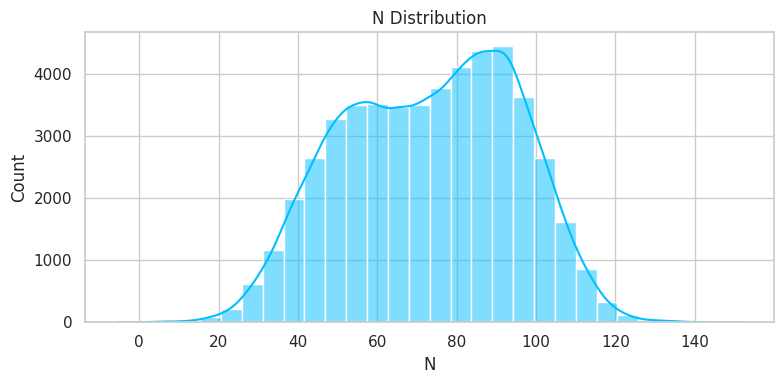

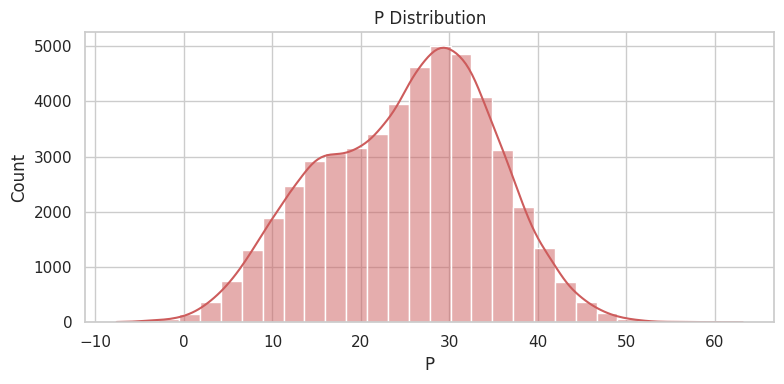

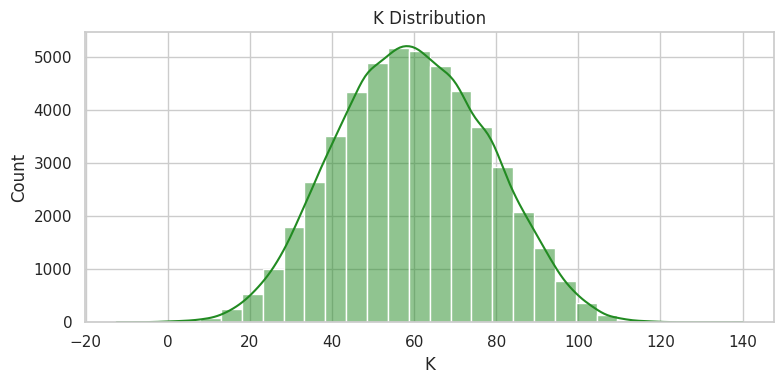

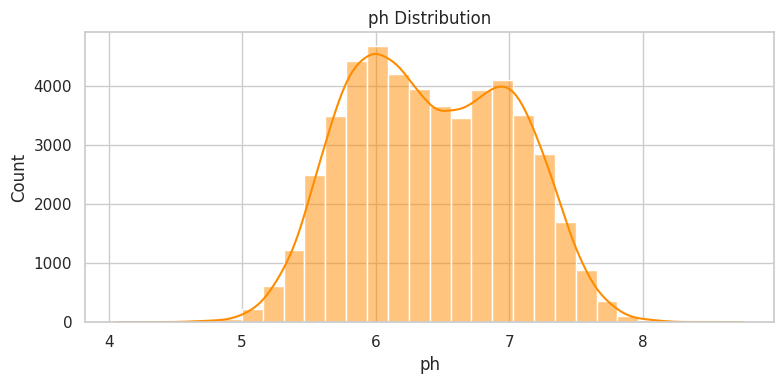

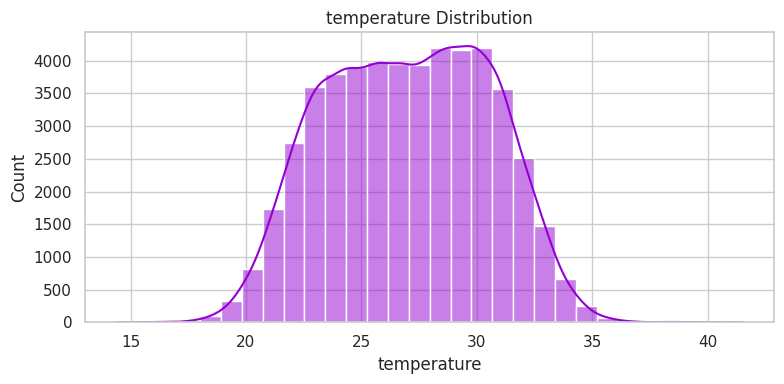

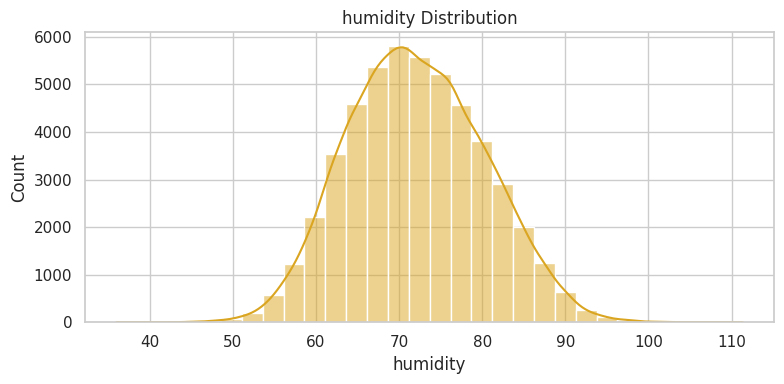

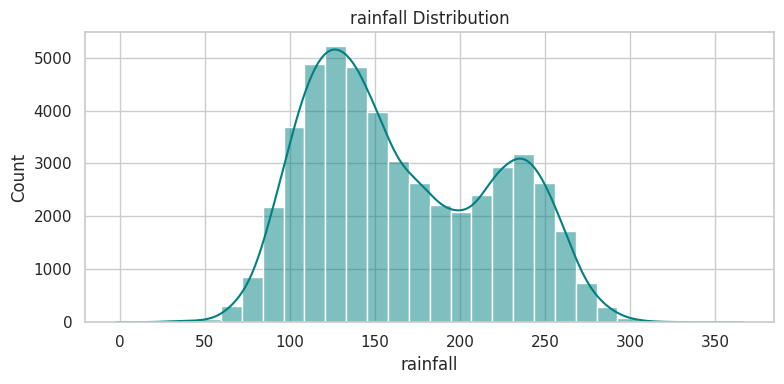

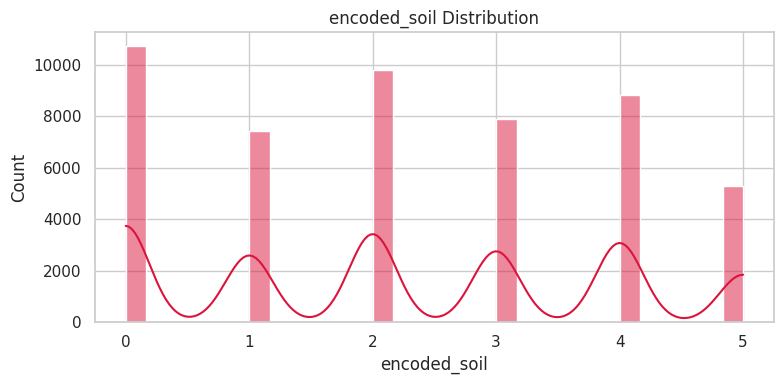

In [ ]:
colors = ['deepskyblue', 'indianred', 'forestgreen', 'darkorange', 'darkviolet', 'goldenrod', 'teal', 'crimson']

for feature, color in zip(features, colors):
    plt.figure(figsize=(8, 4))
    sns.histplot(df[feature], kde=True, bins=30, color=color)
    plt.title(f"{feature} Distribution")
    plt.tight_layout()
    plt.show()

Boxplots

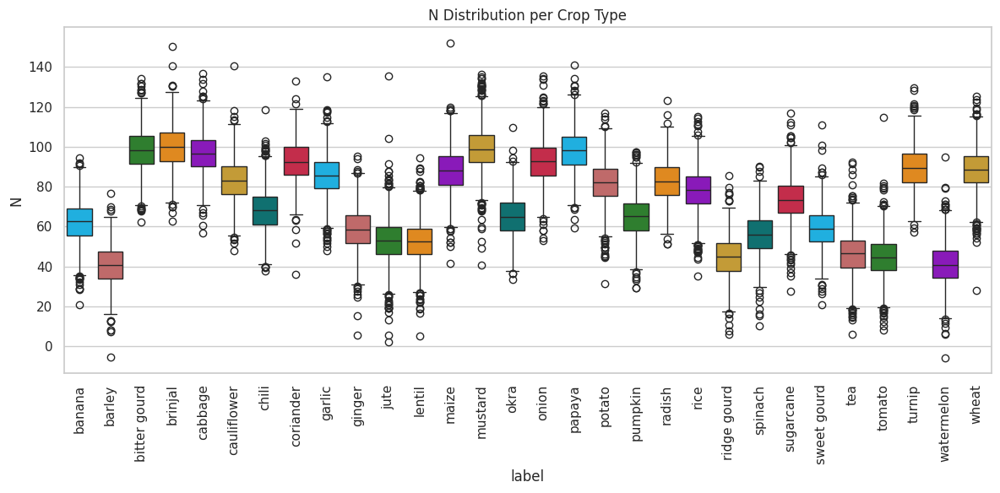

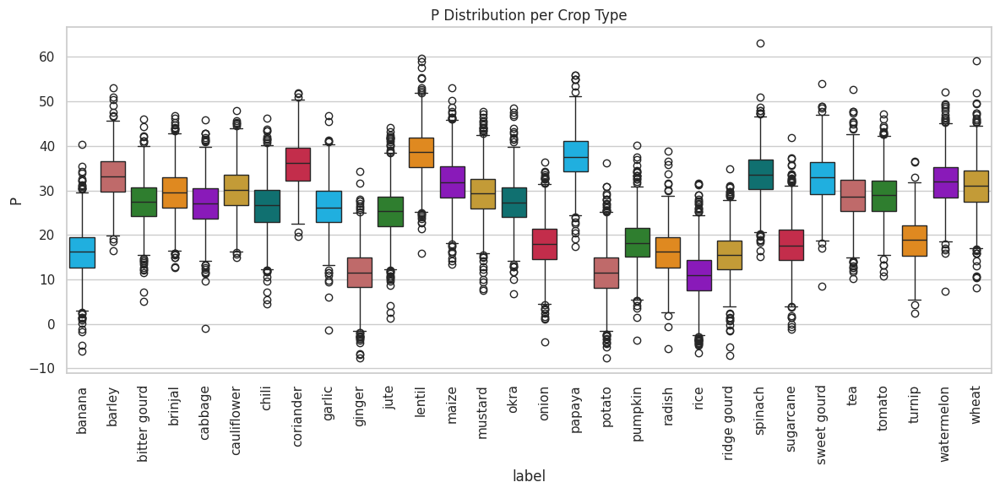

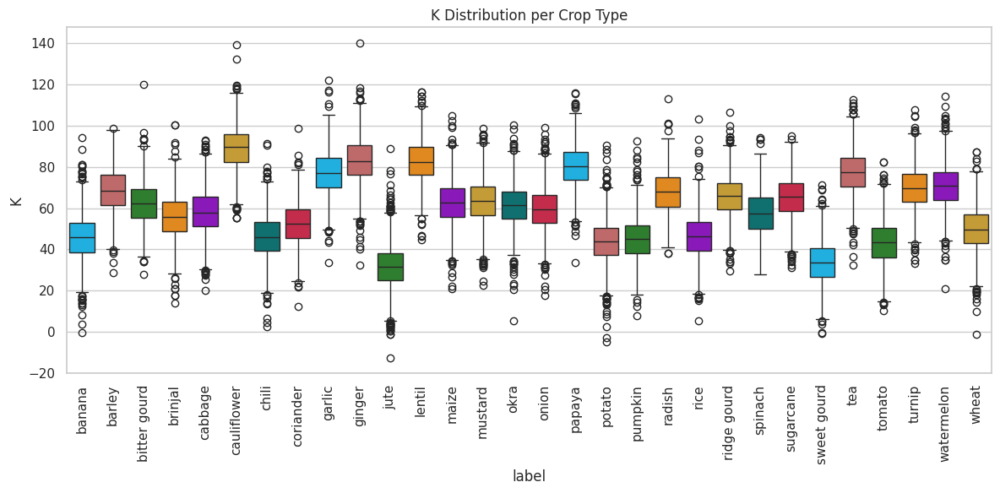

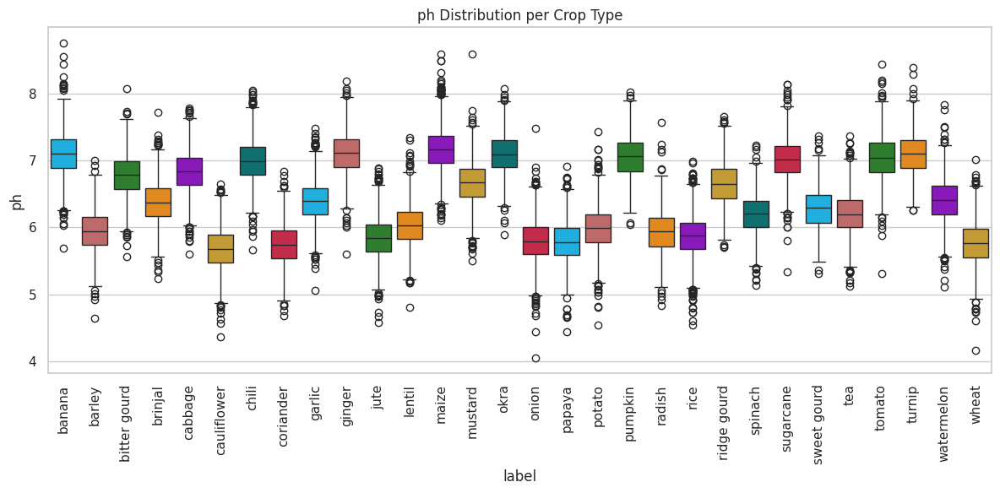

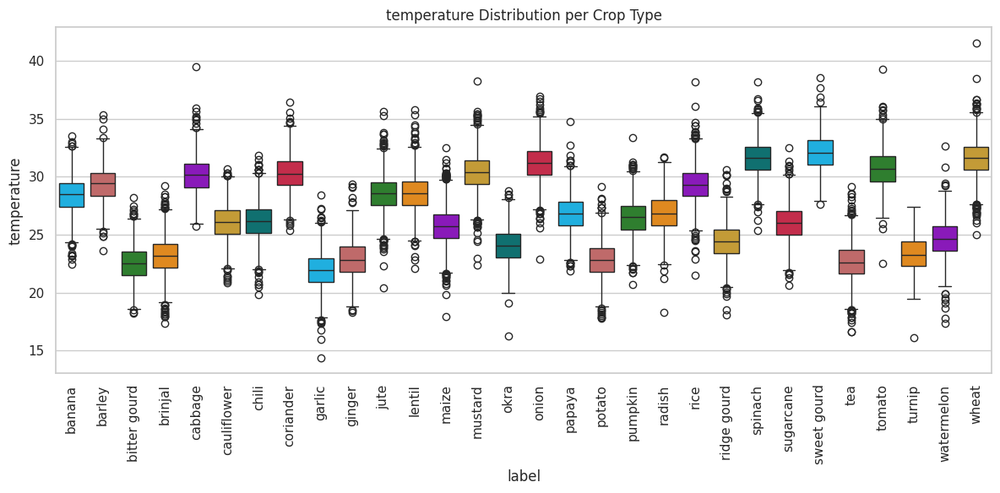

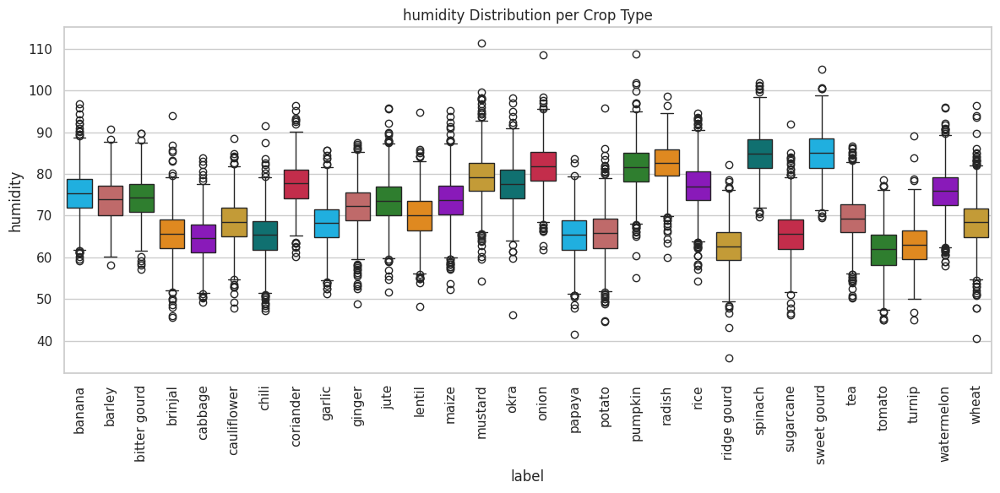

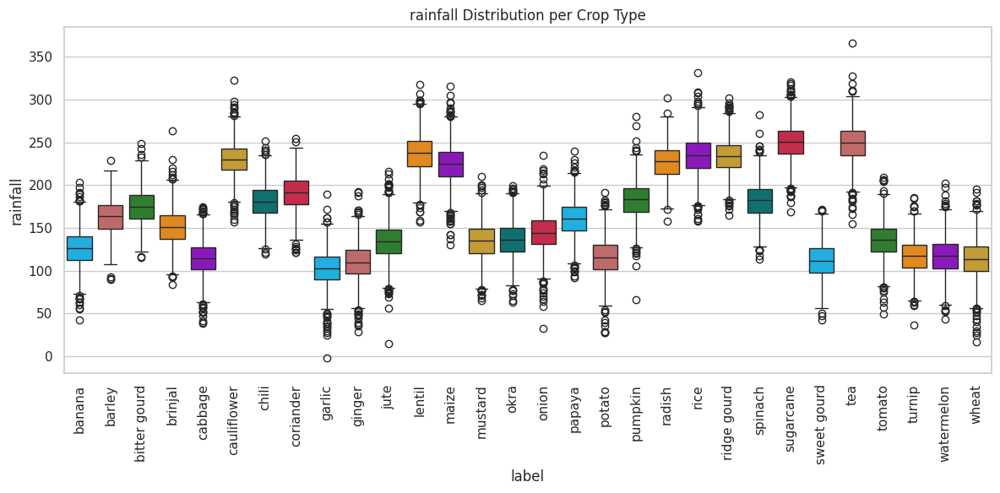

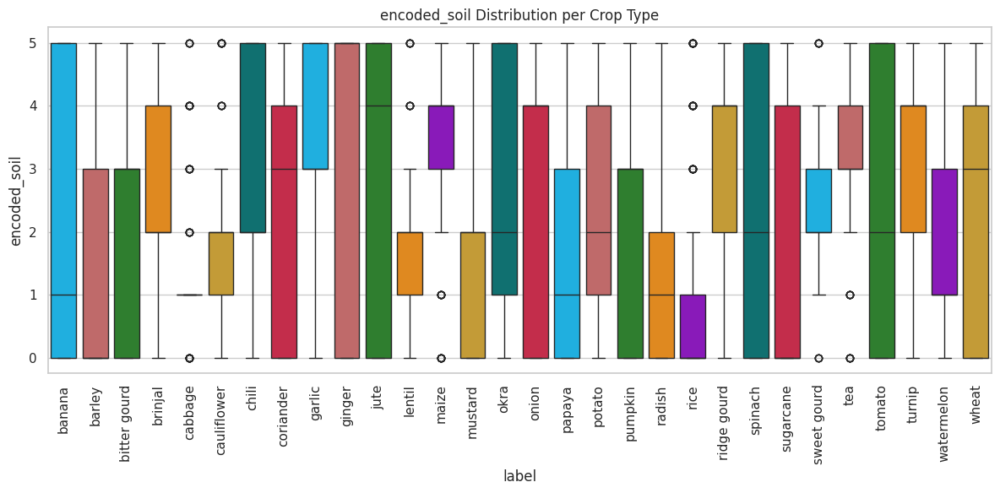

In [ ]:
for feature in features:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x="label", y=feature, data=df, palette=colors)
    plt.xticks(rotation=90)
    plt.title(f"{feature} Distribution per Crop Type")
    plt.tight_layout()
    plt.show()

Violin Plots

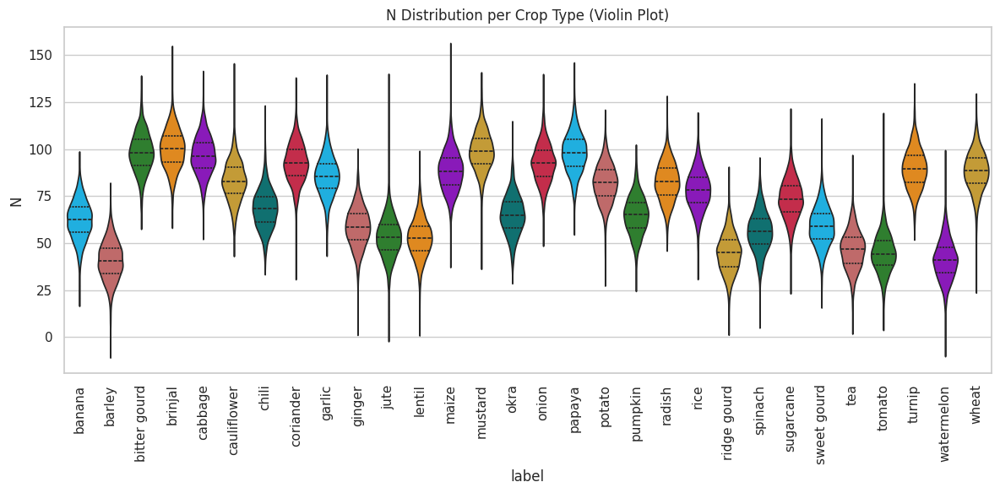

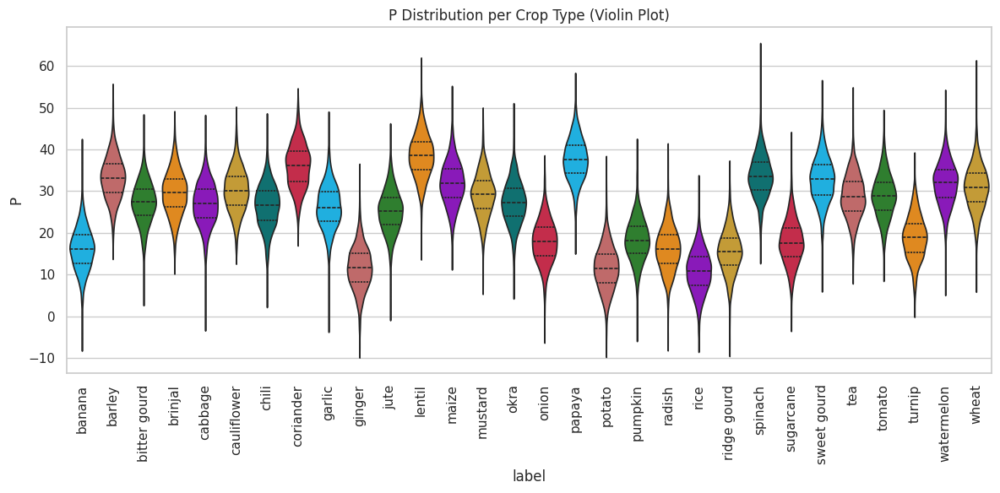

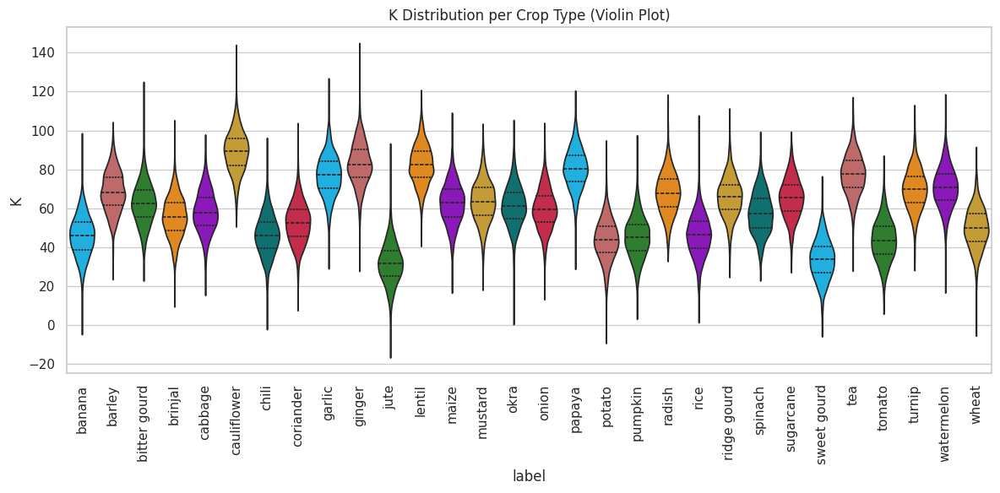

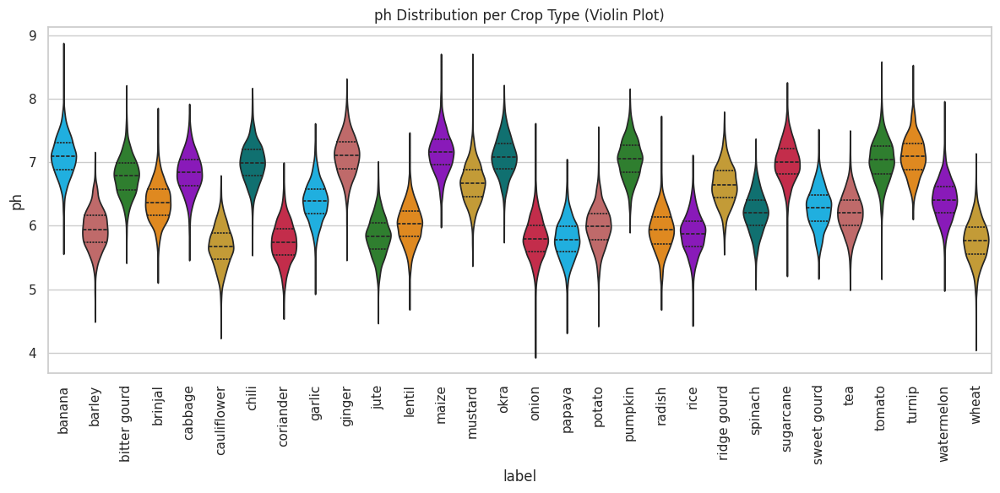

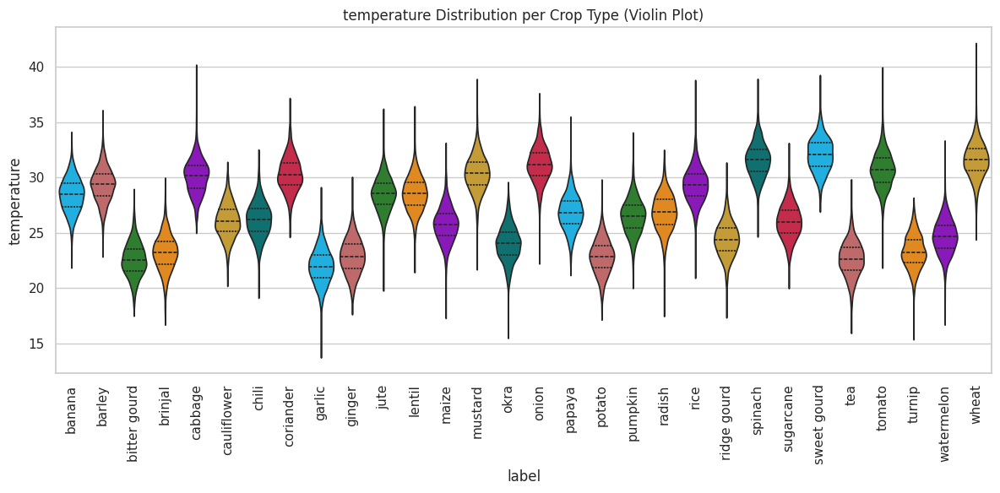

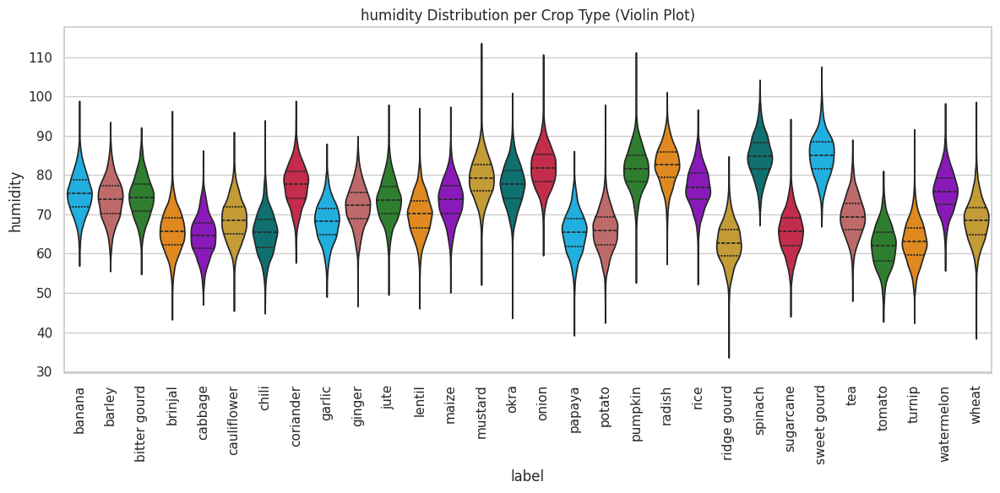

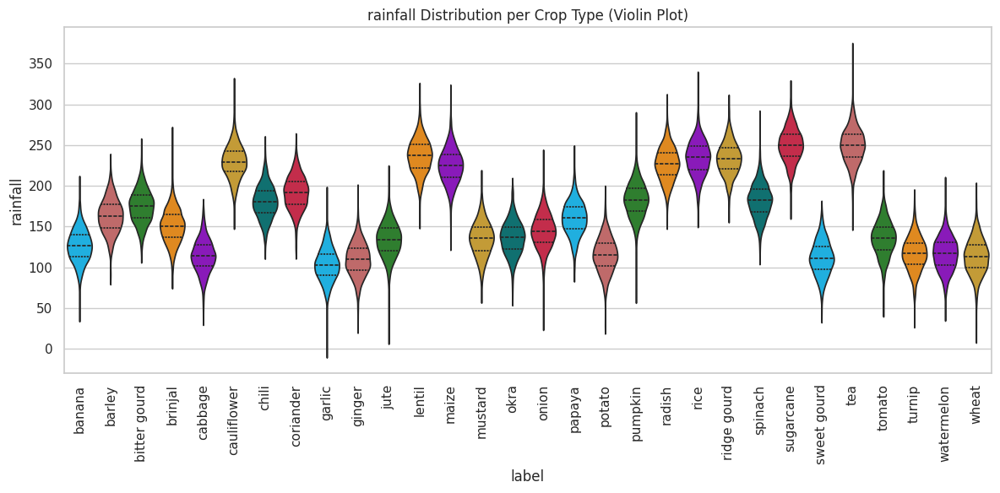

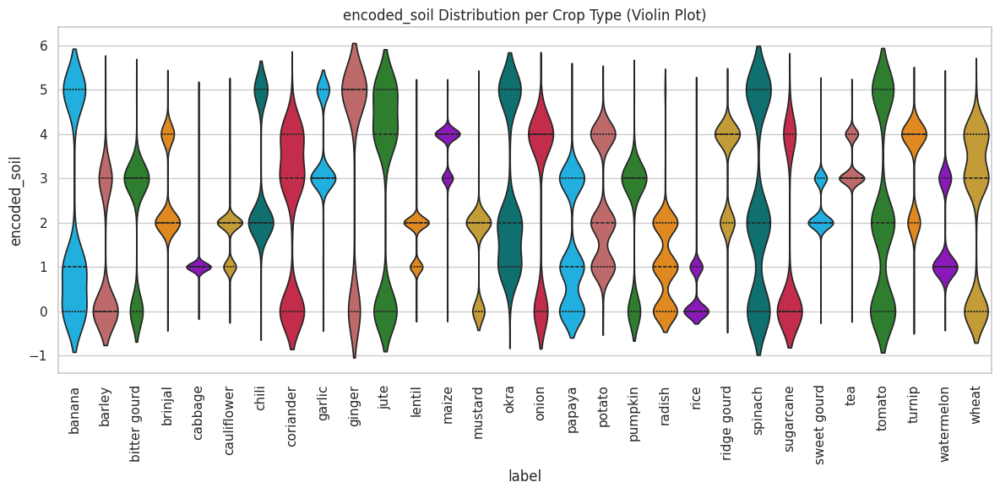

In [ ]:
for feature in features:
    plt.figure(figsize=(12, 6))
    sns.violinplot(x="label", y=feature, data=df, inner="quartile", palette=colors)
    plt.xticks(rotation=90)
    plt.title(f"{feature} Distribution per Crop Type (Violin Plot)")
    plt.tight_layout()
    plt.show()

Correlation Heatmap

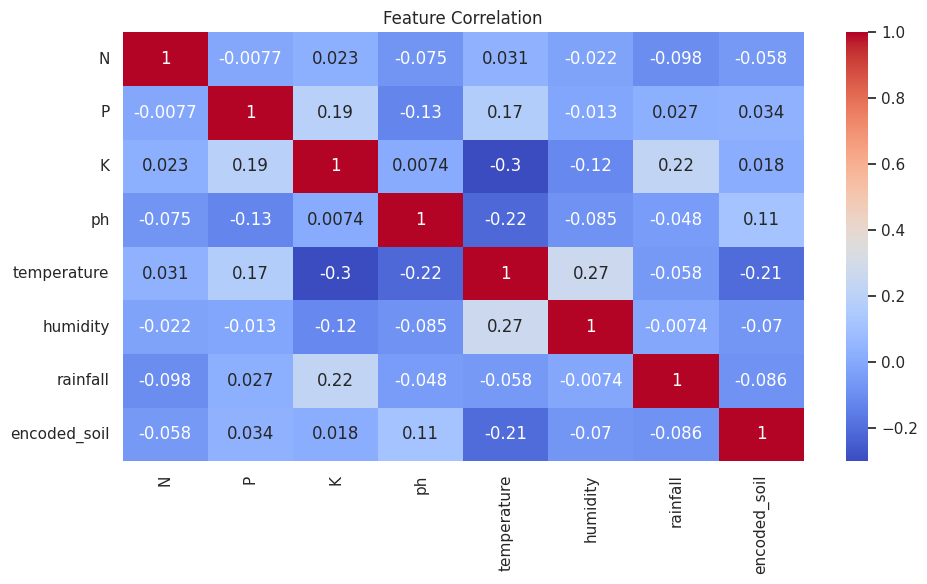

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[features].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation")
plt.tight_layout()
plt.show()

Paiplot

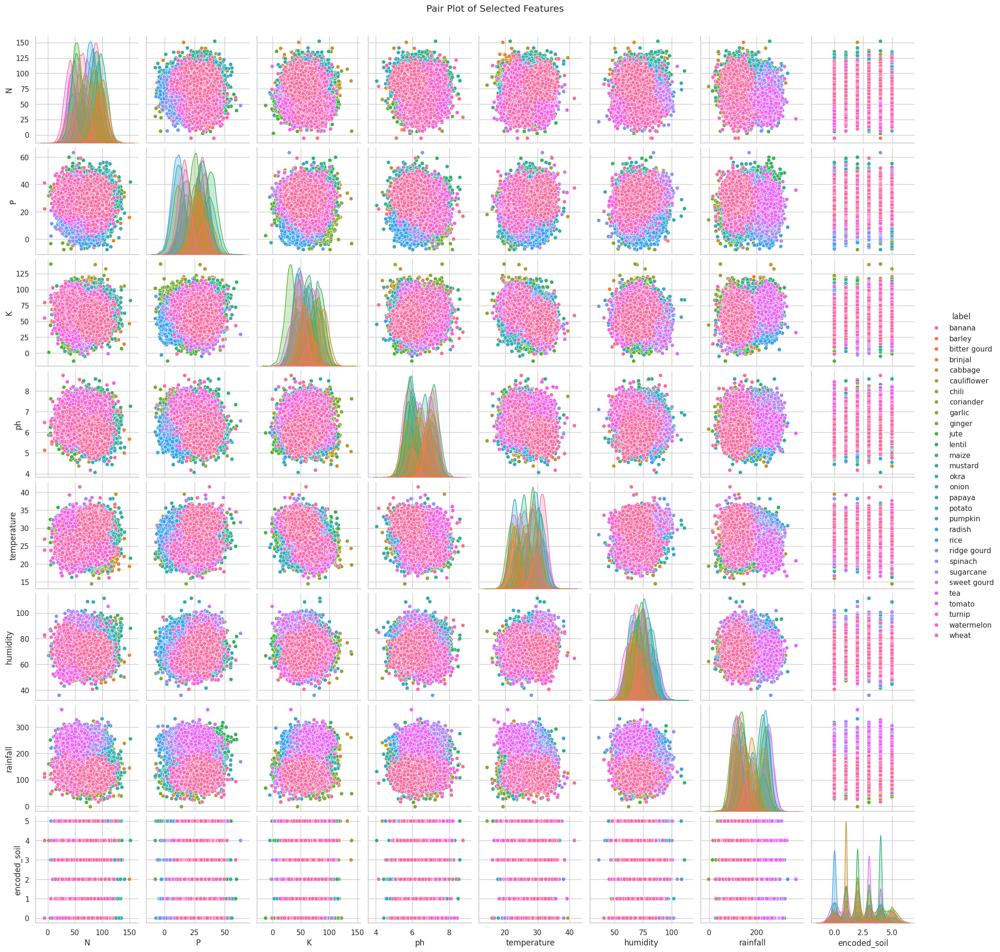

In [ ]:
sns.pairplot(df[features + ['label']], hue='label', palette="husl")
plt.suptitle("Pair Plot of Selected Features", y=1.02)
plt.show()

KDE Plots

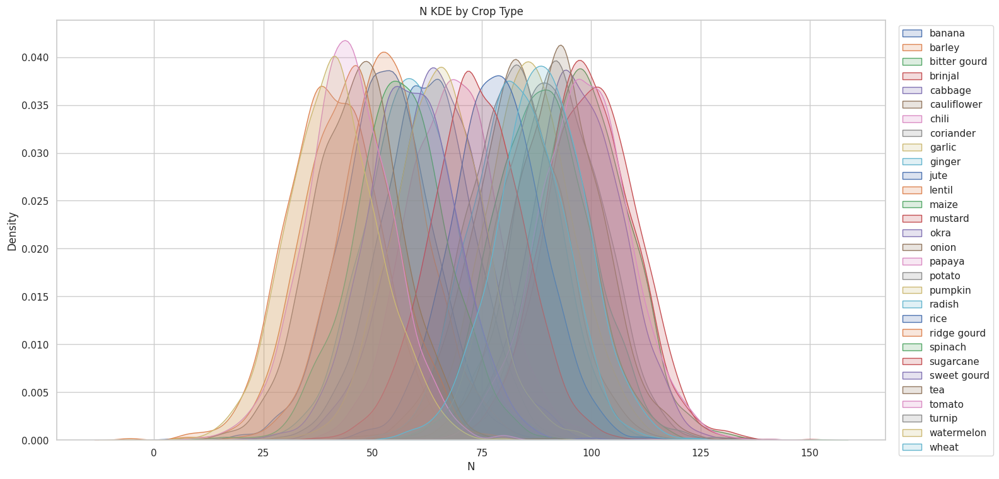

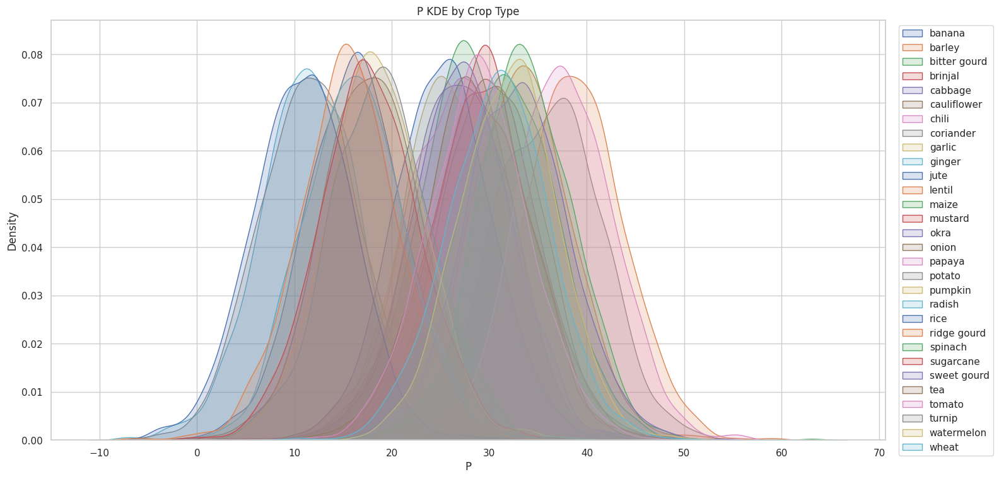

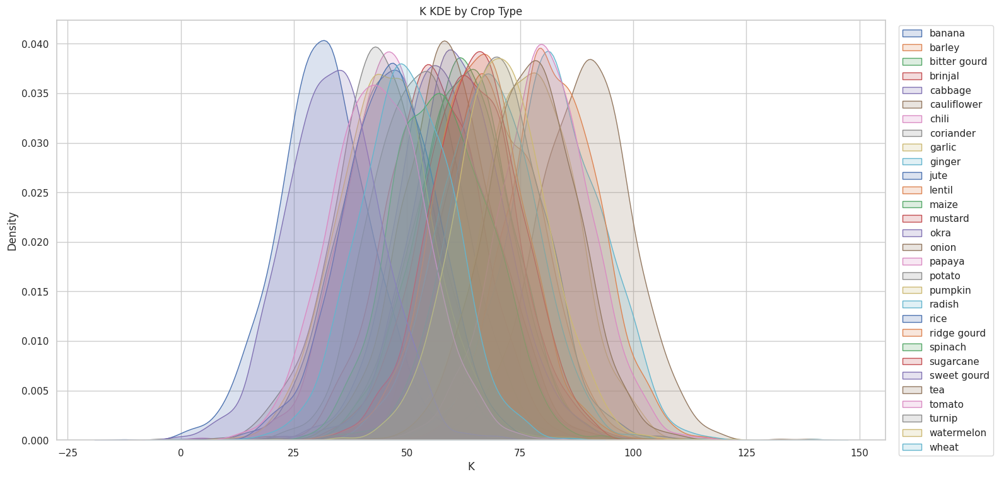

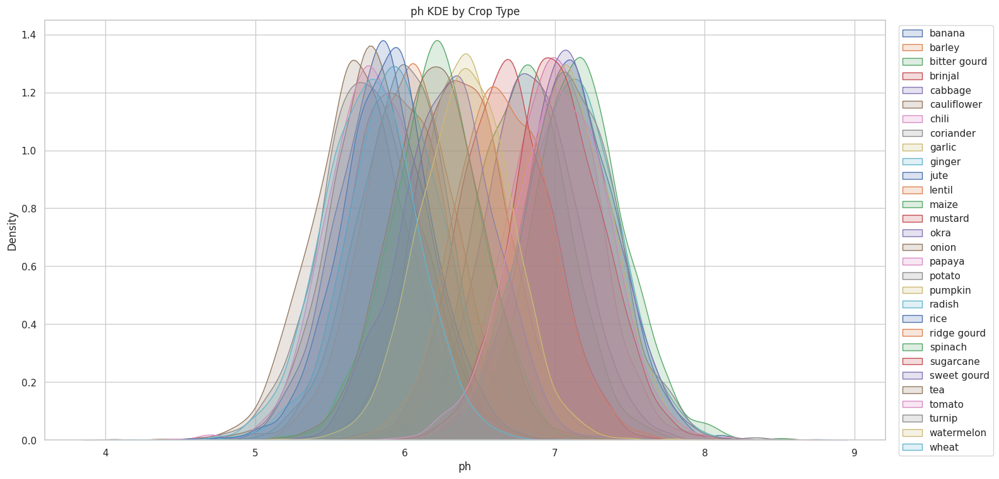

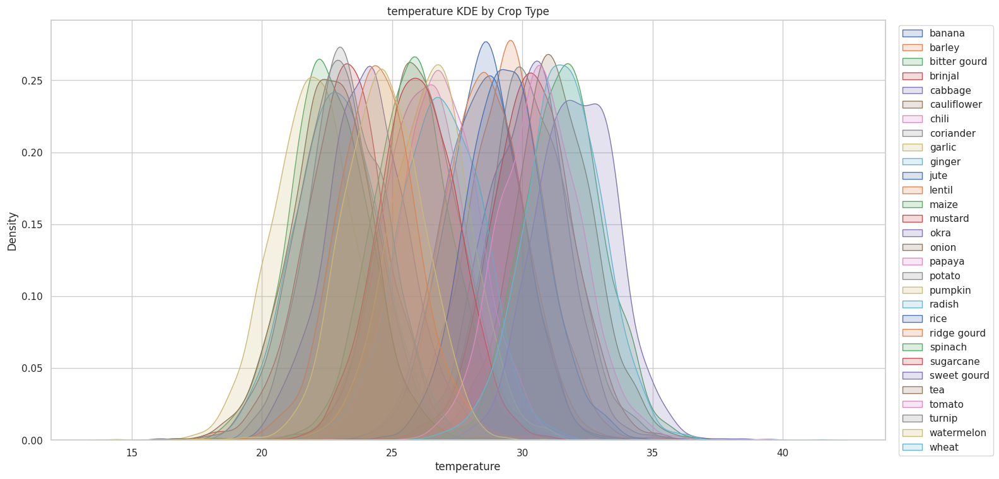

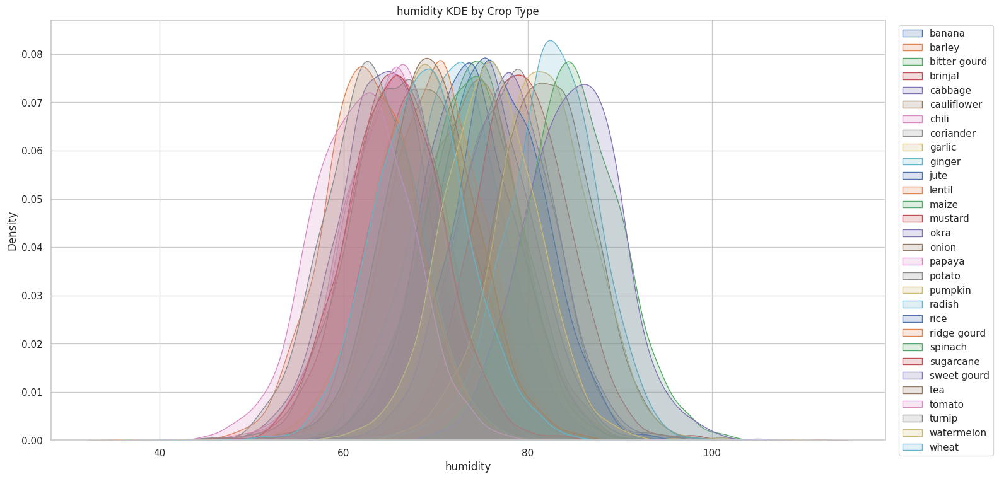

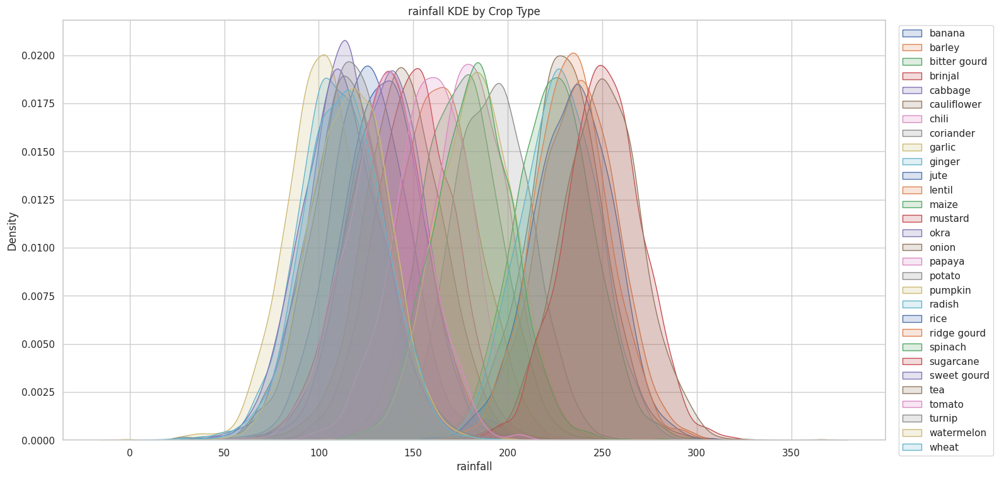

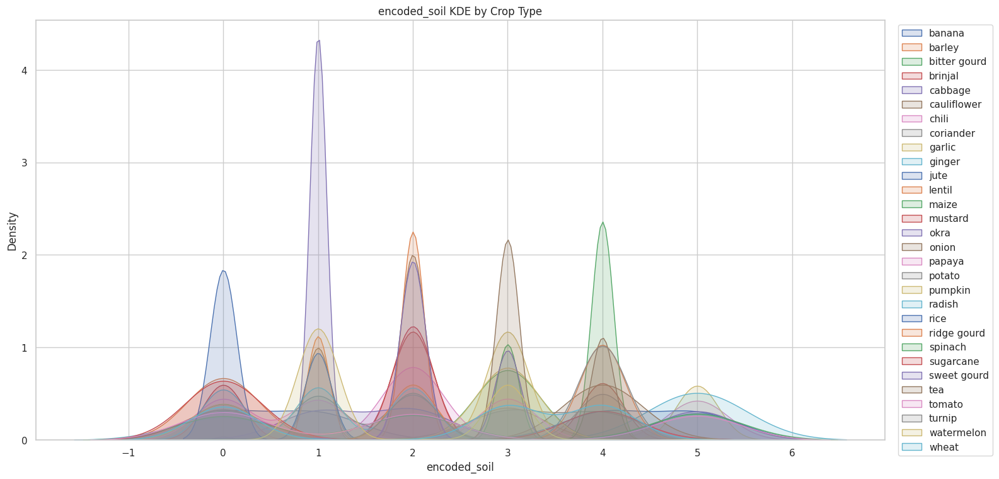

In [ ]:
for feature in features:
    plt.figure(figsize=(16, 8))
    for crop in df['label'].unique():
        subset = df[df['label'] == crop]
        sns.kdeplot(subset[feature], label=crop, fill=True, alpha=0.2)
    plt.title(f"{feature} KDE by Crop Type")
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

Skewness

In [ ]:
print("Skewness:\n", df[features].skew().sort_values(ascending=False))

Skewness:
 rainfall        0.344505
humidity        0.132849
encoded_soil    0.102827
ph              0.072685
K               0.031249
temperature    -0.033407
N              -0.127440
P              -0.206547
dtype: float64


# 5. Train ML Models

In [ ]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=200),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Naive Bayes": GaussianNB(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

results = []

Evaluation: Accuracy, Precision, Recall, F1

In [ ]:
# Initialize list to store results
results = []

# Loop through models and calculate all metrics
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)

    acc = accuracy_score(y_test, preds)
    prec = precision_score(y_test, preds, average='weighted')
    rec = recall_score(y_test, preds, average='weighted')
    f1 = f1_score(y_test, preds, average='weighted')

    results.append({
        'Model': name,
        'Accuracy': acc * 100,
        'Precision': prec * 100,
        'Recall': rec * 100,
        'F1 Score': f1 * 100
    })

# Create and display the DataFrame
results_df = pd.DataFrame(results)
print(results_df.to_string(index=False, formatters={
    'Accuracy': '{:.2f}%'.format,
    'Precision': '{:.2f}%'.format,
    'Recall': '{:.2f}%'.format,
    'F1 Score': '{:.2f}%'.format
}))


              Model Accuracy Precision Recall F1 Score
Logistic Regression   91.58%    91.58% 91.58%   91.56%
      Random Forest   93.57%    93.57% 93.57%   93.55%
      Decision Tree   86.82%    86.90% 86.82%   86.84%
        Naive Bayes   92.71%    92.72% 92.71%   92.69%
                KNN   93.58%    93.60% 93.58%   93.56%
                SVM   93.14%    93.16% 93.14%   93.12%
  Gradient Boosting   93.69%    93.71% 93.69%   93.68%
            XGBoost   93.85%    93.85% 93.85%   93.84%


Confusion Matrix Heatmaps

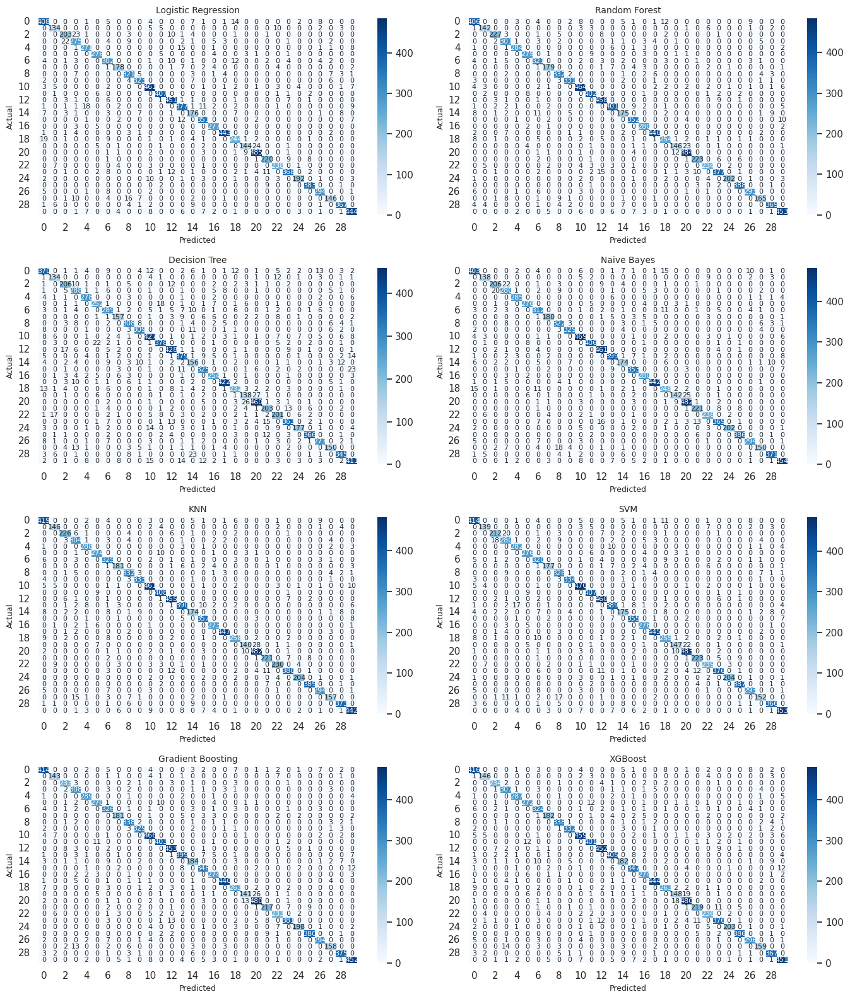

In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(14, 16))
axes = axes.flatten()

for i, (name, model) in enumerate(models.items()):
    preds = model.predict(X_test)
    cm = confusion_matrix(y_test, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i], annot_kws={'size': 8})
    axes[i].set_title(f"{name}", fontsize=10)
    axes[i].set_xlabel('Predicted', fontsize=9)
    axes[i].set_ylabel('Actual', fontsize=9)

plt.tight_layout()
plt.show()

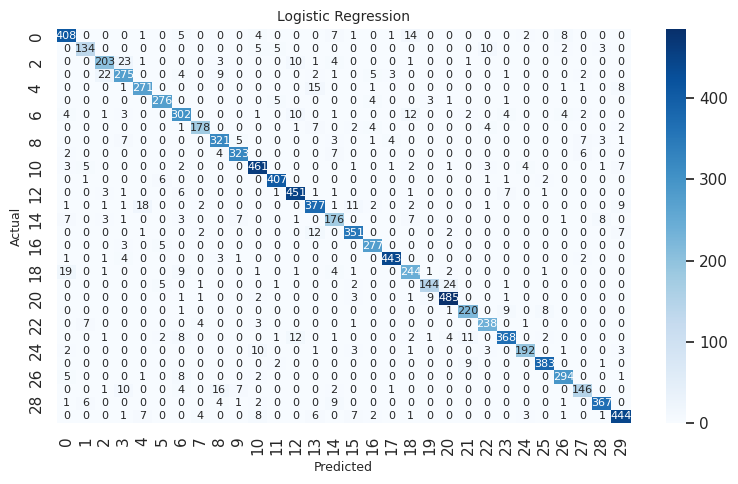

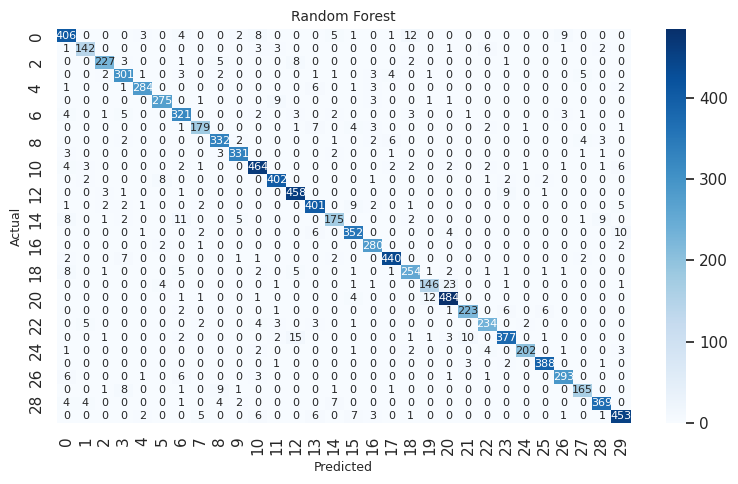

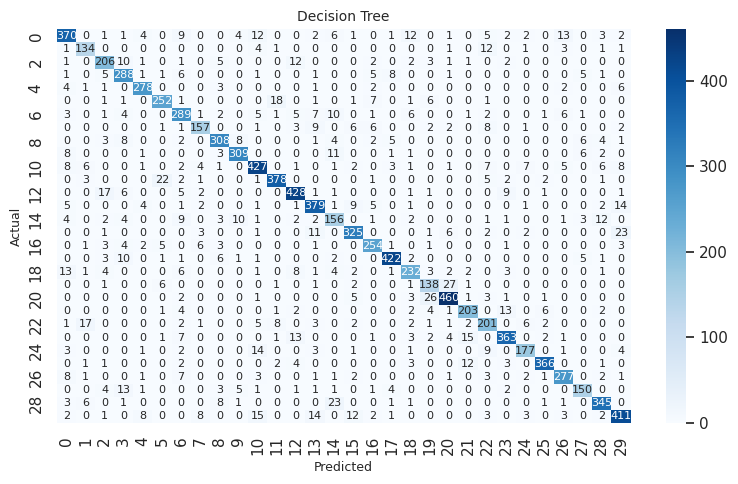

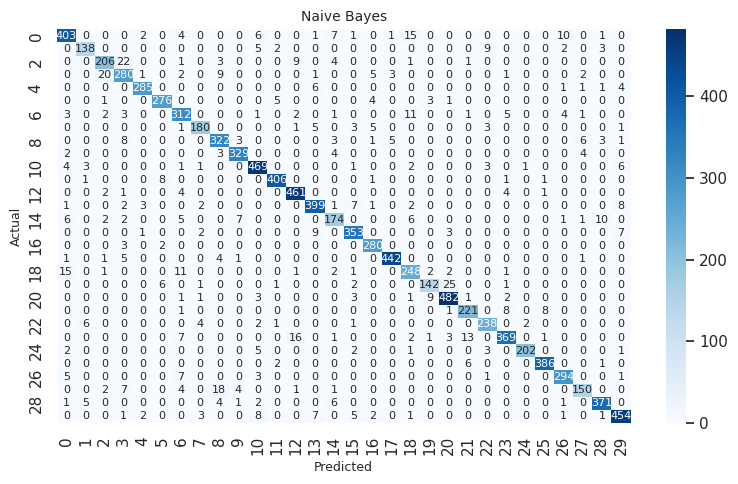

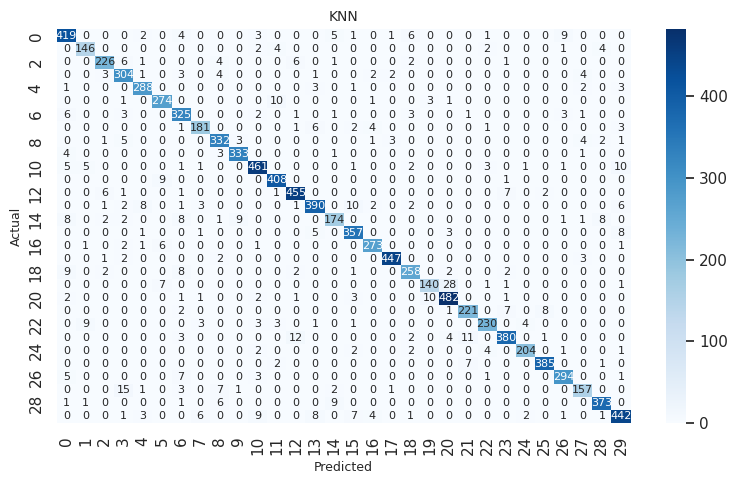

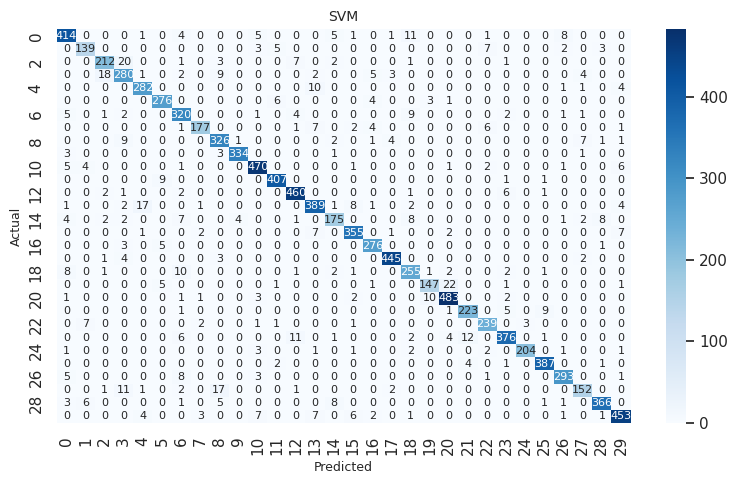

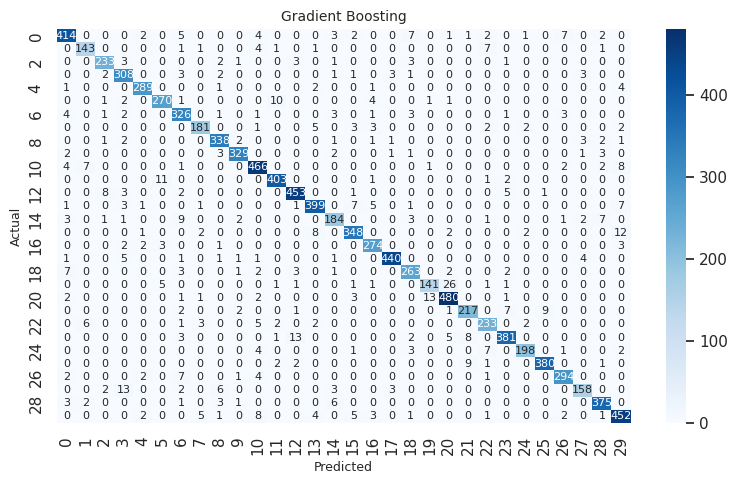

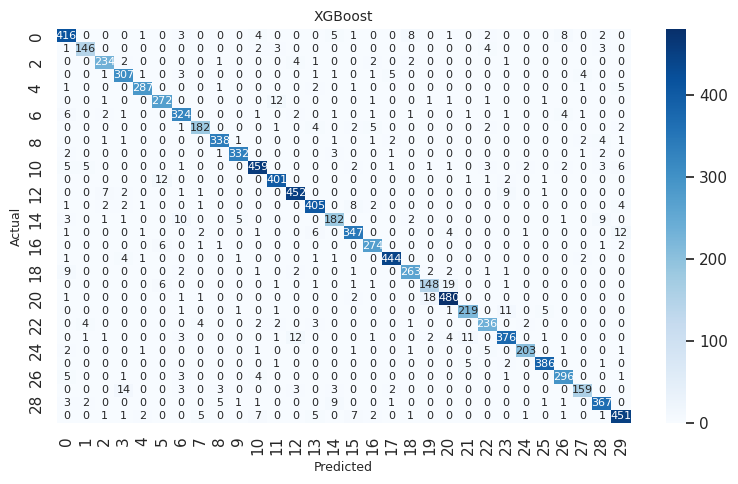

In [ ]:
for name, model in models.items():
    preds = model.predict(X_test)
    cm = confusion_matrix(y_test, preds)

    plt.figure(figsize=(8, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 8})
    plt.title(f"{name}", fontsize=10)
    plt.xlabel('Predicted', fontsize=9)
    plt.ylabel('Actual', fontsize=9)
    plt.tight_layout()
    plt.show()

Classification Report

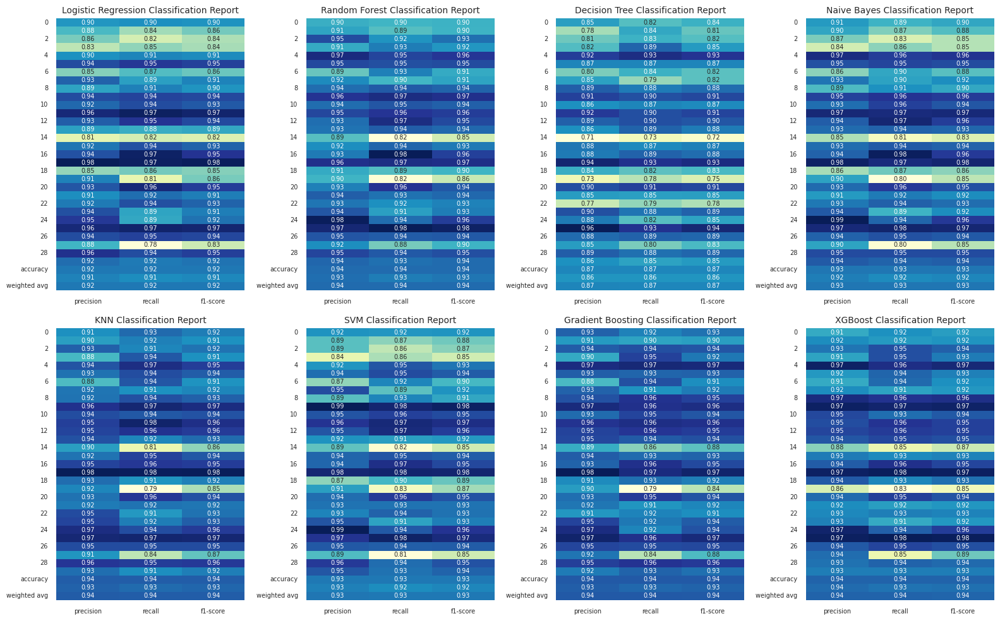

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(16, 10))
axes = axes.flatten()

for i, (name, model) in enumerate(models.items()):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    report_dict = classification_report(y_test, preds, output_dict=True)
    report_df = pd.DataFrame(report_dict).transpose()
    report_df = report_df[["precision", "recall", "f1-score"]]
    sns.heatmap(report_df, annot=True, fmt=".2f", cmap="YlGnBu", cbar=False, ax=axes[i], annot_kws={"size": 7})
    axes[i].set_title(f'{name} Classification Report', fontsize=10)
    axes[i].tick_params(axis='x', labelsize=7)
    axes[i].tick_params(axis='y', labelsize=7)

plt.tight_layout()
plt.show()

# 6. Deep Learning (ANN) Model

In [ ]:
# One-hot encode target
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)
num_classes = y_train_cat.shape[1]

# Build upgraded ANN model
ann_model = Sequential([
    Dense(1024, activation=gelu, kernel_initializer='lecun_normal', kernel_regularizer=l2(0.0003), input_shape=(X_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(512, activation=gelu, kernel_initializer='lecun_normal', kernel_regularizer=l2(0.0003)),
    BatchNormalization(),
    Dropout(0.35),

    Dense(256, activation=gelu, kernel_initializer='lecun_normal', kernel_regularizer=l2(0.0003)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation=gelu, kernel_initializer='lecun_normal', kernel_regularizer=l2(0.0003)),
    Dropout(0.25),

    Dense(64, activation=gelu, kernel_initializer='lecun_normal'),
    Dropout(0.2),

    Dense(num_classes, activation='softmax')
])

# Compile model with label smoothing
loss_fn = CategoricalCrossentropy(label_smoothing=0.05)
optimizer = Adam(learning_rate=0.0005, clipnorm=1.0)
ann_model.compile(optimizer=optimizer, loss=loss_fn, metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True),
    ModelCheckpoint('ann_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-6)
]

# Train the model
history = ann_model.fit(
    X_train, y_train_cat,
    validation_split=0.2,
    epochs=300,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)


Epoch 1/300
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6118 - loss: 2.2114

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - accuracy: 0.6121 - loss: 2.2106 - val_accuracy: 0.9082 - val_loss: 1.2045 - learning_rate: 5.0000e-04
Epoch 2/300
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8324 - loss: 1.4274

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - accuracy: 0.8324 - loss: 1.4274 - val_accuracy: 0.9140 - val_loss: 1.0839 - learning_rate: 5.0000e-04
Epoch 3/300
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8497 - loss: 1.2960

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.8497 - loss: 1.2959 - val_accuracy: 0.9206 - val_loss: 0.9908 - learning_rate: 5.0000e-04
Epoch 4/300
 998/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8634 - loss: 1.1830

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.8634 - loss: 1.1829 - val_accuracy: 0.9219 - val_loss: 0.9352 - learning_rate: 5.0000e-04
Epoch 5/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8685 - loss: 1.1199

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.8685 - loss: 1.1198 - val_accuracy: 0.9281 - val_loss: 0.8800 - learning_rate: 5.0000e-04
Epoch 6/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8765 - loss: 1.0576

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.8765 - loss: 1.0576 - val_accuracy: 0.9351 - val_loss: 0.8326 - learning_rate: 5.0000e-04
Epoch 7/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8824 - loss: 1.0135

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - accuracy: 0.8824 - loss: 1.0135 - val_accuracy: 0.9409 - val_loss: 0.8035 - learning_rate: 5.0000e-04
Epoch 8/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.8861 - loss: 0.9890 - val_accuracy: 0.9362 - val_loss: 0.7922 - learning_rate: 5.0000e-04
Epoch 9/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.8899 - loss: 0.9613 - val_accuracy: 0.9379 - val_loss: 0.7724 - learning_rate: 5.0000e-04
Epoch 10/300
 998/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8960 - loss: 0.9250

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.8960 - loss: 0.9250 - val_accuracy: 0.9423 - val_loss: 0.7577 - learning_rate: 5.0000e-04
Epoch 11/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.8948 - loss: 0.9138 - val_accuracy: 0.9383 - val_loss: 0.7517 - learning_rate: 5.0000e-04
Epoch 12/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.9012 - loss: 0.8936 - val_accuracy: 0.9421 - val_loss: 0.7426 - learning_rate: 5.0000e-04
Epoch 13/300
 998/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9054 - loss: 0.8735

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - accuracy: 0.9054 - loss: 0.8735 - val_accuracy: 0.9454 - val_loss: 0.7199 - learning_rate: 5.0000e-04
Epoch 14/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - accuracy: 0.9063 - loss: 0.8644 - val_accuracy: 0.9441 - val_loss: 0.7158 - learning_rate: 5.0000e-04
Epoch 15/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.9062 - loss: 0.8590 - val_accuracy: 0.9442 - val_loss: 0.7180 - learning_rate: 5.0000e-04
Epoch 16/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.9056 - loss: 0.8537 - val_accuracy: 0.9450 - val_loss: 0.7058 - learning_rate: 5.0000e-04
Epoch 17/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - accuracy: 0.9100 - loss: 0.8320 - val_accuracy: 0.9435 - val_loss: 0.7059 - learning_rate: 5.0000e-04
Epoch 18/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.9098 - loss: 0.8275 - val_accuracy: 0.9445 - val_loss: 0.7045 - learning_rate: 5.0000e-04
Epoch 19/300
1000/1000 ━━━━━━━━━━━━━━━━━━

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - accuracy: 0.9185 - loss: 0.7955 - val_accuracy: 0.9457 - val_loss: 0.6856 - learning_rate: 5.0000e-04
Epoch 23/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - accuracy: 0.9216 - loss: 0.7784 - val_accuracy: 0.9435 - val_loss: 0.6870 - learning_rate: 5.0000e-04
Epoch 24/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - accuracy: 0.9173 - loss: 0.7893 - val_accuracy: 0.9421 - val_loss: 0.6896 - learning_rate: 5.0000e-04
Epoch 25/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - accuracy: 0.9223 - loss: 0.7733 - val_accuracy: 0.9427 - val_loss: 0.6882 - learning_rate: 5.0000e-04
Epoch 26/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.9188 - loss: 0.7777 - val_accuracy: 0.9450 - val_loss: 0.6834 - learning_rate: 5.0000e-04
Epoch 27/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.9203 - loss: 0.7732 - val_accuracy: 0.9423 - val_loss: 0.6891 - learning_rate: 5.0000e-04
Epoch 28/300
1000/1000 ━━━━━━━━━━━━━━━━━━

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.9221 - loss: 0.7667 - val_accuracy: 0.9474 - val_loss: 0.6746 - learning_rate: 5.0000e-04
Epoch 31/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - accuracy: 0.9215 - loss: 0.7669 - val_accuracy: 0.9452 - val_loss: 0.6825 - learning_rate: 5.0000e-04
Epoch 32/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.9239 - loss: 0.7601 - val_accuracy: 0.9464 - val_loss: 0.6797 - learning_rate: 5.0000e-04
Epoch 33/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - accuracy: 0.9228 - loss: 0.7505 - val_accuracy: 0.9466 - val_loss: 0.6761 - learning_rate: 5.0000e-04
Epoch 34/300
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9246 - loss: 0.7485

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.9246 - loss: 0.7485 - val_accuracy: 0.9475 - val_loss: 0.6755 - learning_rate: 5.0000e-04
Epoch 35/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - accuracy: 0.9255 - loss: 0.7447 - val_accuracy: 0.9433 - val_loss: 0.6790 - learning_rate: 5.0000e-04
Epoch 36/300
 999/1000 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9227 - loss: 0.7499

1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - accuracy: 0.9227 - loss: 0.7499 - val_accuracy: 0.9494 - val_loss: 0.6742 - learning_rate: 5.0000e-04
Epoch 37/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - accuracy: 0.9241 - loss: 0.7512 - val_accuracy: 0.9457 - val_loss: 0.6701 - learning_rate: 5.0000e-04
Epoch 38/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - accuracy: 0.9259 - loss: 0.7490 - val_accuracy: 0.9451 - val_loss: 0.6733 - learning_rate: 5.0000e-04
Epoch 39/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.9280 - loss: 0.7409 - val_accuracy: 0.9460 - val_loss: 0.6681 - learning_rate: 5.0000e-04
Epoch 40/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - accuracy: 0.9255 - loss: 0.7402 - val_accuracy: 0.9466 - val_loss: 0.6638 - learning_rate: 5.0000e-04
Epoch 41/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.9260 - loss: 0.7446 - val_accuracy: 0.9469 - val_loss: 0.6654 - learning_rate: 5.0000e-04
Epoch 42/300
1000/1000 ━━━━━━━━━━━━━━━━━━

 Model Architecture Diagram

In [ ]:
plot_model(ann_model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

In [ ]:
def draw_ann():
    fig, ax = plt.subplots(figsize=(20, 8))

    # Layer configuration
    layers = [
        {"name": "Input Layer", "n": 8, "labels": ["Soil Type", "Rainfall", "Humidity", "Temperature","Soil pH", "K", "P", "N"]},
        {"name": "HL 1\n\nGELU", "n": 10, "neurons": "n = 1024"},
        {"name": "HL 2\n\nGELU", "n": 10, "neurons": "n = 512"},
        {"name": "HL 3\n\nGELU", "n": 10, "neurons": "n = 256"},
        {"name": "HL 4\n\nGELU", "n": 10, "neurons": "n = 128"},
        {"name": "HL 5\n\nGELU", "n": 10, "neurons": "n = 64"},
        {"name": "Output Layer\n\nSoftmax", "n": 3, "labels": ["Crop 1", "Crop 2", "Crop 3"]}
    ]

    # Node positions
    layer_x = 0
    for i, layer in enumerate(layers):
        y_start = (max(l["n"] for l in layers) - layer["n"]) / 2
        for j in range(layer["n"]):
            circle = plt.Circle((layer_x, y_start + j), 0.3, color='skyblue', ec='black', zorder=2)
            ax.add_patch(circle)

            # Feature labels for input layer
            if "labels" in layer and j < len(layer["labels"]) and i == 0:
                ax.text(layer_x - 1.2, y_start + j, layer["labels"][j], fontsize=9, va='center')

            # Output labels
            if "labels" in layer and j < len(layer["labels"]) and i == len(layers)-1:
                ax.text(layer_x + 0.8, y_start + j, layer["labels"][j], fontsize=9, va='center')

        # Layer name on top
        ax.text(layer_x, y_start + layer["n"] + 1, layer["name"], ha='center', fontsize=11, fontweight='bold')

        # Neuron count at bottom (except input layer)
        if "neurons" in layer:
            ax.text(layer_x, y_start - 1, layer["neurons"], ha='center', fontsize=9, style='italic')

        # Connections to next layer
        if i < len(layers) - 1:
            next_layer_n = layers[i+1]["n"]
            next_y_start = (max(l["n"] for l in layers) - next_layer_n) / 2
            for j in range(layer["n"]):
                for k in range(next_layer_n):
                    ax.plot([layer_x, layer_x + 2], [y_start + j, next_y_start + k], 'gray', lw=0.5, zorder=1)

        layer_x += 2

    ax.set_xlim(-2, layer_x + 1)
    ax.set_ylim(-2, max(l["n"] for l in layers) + 3)
    ax.axis('off')
    plt.title("Artificial Neural Network Architecture", fontsize=14, fontweight='bold')
    plt.show()

draw_ann()

Training & Validation Accuracy/Loss

In [ ]:
# Accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

# Loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Get final scores
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]

# Print neatly
print(f"Final Scores:")
print(f"• Training Accuracy: {train_acc*100:.2f}%")
print(f"• Validation Accuracy: {val_acc*100:.2f}%")
print(f"• Training Loss: {train_loss:.4f}")
print(f"• Validation Loss: {val_loss:.4f}")

Learning Rate vs Loss Curve

In [ ]:
# Learning Rate vs Loss
learning_rates = np.logspace(-5, -3, 6)
losses = []

for lr in learning_rates:
    temp_model = clone_model(ann_model)
    temp_model.build(input_shape=(None, X_train.shape[1]))
    temp_model.compile(optimizer=Adam(learning_rate=lr), loss=CategoricalCrossentropy(label_smoothing=0.05), metrics=['accuracy'])
    history = temp_model.fit(X_train, y_train_cat, epochs=1, batch_size=32, verbose=0)
    losses.append(history.history['loss'][0])

plt.plot(learning_rates, losses, marker='o')
plt.xscale('log')
plt.xlabel("Learning Rate"), plt.ylabel("Training Loss")
plt.title("Learning Rate vs Training Loss")
plt.grid(True), plt.show()

Dropout Effect

In [ ]:
def build_model_with_dropout(dropout_rate):
    temp_model = clone_model(ann_model)
    temp_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return temp_model

dropout_rates = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
val_accuracies = []

for rate in dropout_rates:
    print(f"Training with dropout = {rate}")
    temp_model = build_model_with_dropout(rate)
    history = temp_model.fit(X_train, y_train_cat, validation_split=0.2, epochs=50, batch_size=32, verbose=0)
    val_accuracies.append(max(history.history['val_accuracy']))

# Plotting the results
plt.figure(figsize=(8, 5))
plt.plot(dropout_rates, val_accuracies, marker='o')
plt.xlabel("Dropout Rate")
plt.ylabel("Max Validation Accuracy")
plt.title("Effect of Dropout Rate on Model Performance")
plt.grid(True)
plt.show()

Evaluation

In [ ]:
ann_test_loss, ann_test_accuracy = ann_model.evaluate(X_test, y_test_cat)
print(f"ANN Accuracy: {ann_test_accuracy*100:.2f}%")

Classification Report for ANN

In [ ]:
y_pred_ann = ann_model.predict(X_test)
y_pred_classes = np.argmax(y_pred_ann, axis=1)
print(classification_report(y_test, y_pred_classes, target_names=class_names))

Confusion Matrix for ANN

In [ ]:
cm = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 7})
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("ANN Confusion Matrix")
plt.tight_layout()
plt.show()

Cohen's Kappa

In [ ]:
print(f"Cohen's Kappa Score: {cohen_kappa_score(y_test, y_pred_classes)*100:.2f}%")

**Feature Importance with ANN**

In [ ]:
features = ['N', 'P', 'K', 'ph', 'temperature', 'humidity', 'rainfall', 'encoded_soil']
baseline_acc = accuracy_score(y_test, np.argmax(y_pred_ann, axis=1))
importances = []

for i in range(X_test.shape[1]):
    X_perm = X_test.copy()
    np.random.shuffle(X_perm[:, i])
    importances.append(baseline_acc - accuracy_score(y_test, np.argmax(ann_model.predict(X_perm), axis=1)))

df = pd.DataFrame({"Feature": features, "Importance": importances}).sort_values("Importance", ascending=False)

plt.figure(figsize=(10,6))
ax = sns.barplot(x="Importance", y="Feature", data=df, palette="magma")
plt.xlim(0, df.Importance.max() + 0.05)
fs = ax.get_yticklabels()[0].get_fontsize()

for bar in ax.patches:
    plt.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
             f'{bar.get_width()*100:.2f}%', va='center', ha='left', fontsize=fs, color='black')

plt.title("Feature Importance (Permutation)")
plt.tight_layout()
plt.show()

In [ ]:
print("Top 5 Important Features:")
print(importance_df.head())

# 7. Final Model Comparison

In [ ]:
results = [
    ("Logistic Regression", LogisticRegression(max_iter=200).fit(X_train, y_train).score(X_test, y_test)),
    ("Random Forest", RandomForestClassifier(n_estimators=100, random_state=537).fit(X_train, y_train).score(X_test, y_test)),
    ("Decision Tree", DecisionTreeClassifier(random_state=537).fit(X_train, y_train).score(X_test, y_test)),
    ("Naive Bayes", GaussianNB().fit(X_train, y_train).score(X_test, y_test)),
    ("KNN", KNeighborsClassifier(n_neighbors=5).fit(X_train, y_train).score(X_test, y_test)),
    ("SVM", SVC(kernel='rbf', probability=True).fit(X_train, y_train).score(X_test, y_test)),
    ("Gradient Boosting", GradientBoostingClassifier(random_state=42).fit(X_train, y_train).score(X_test, y_test)),
    ("XGBoost", XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=537).fit(X_train, y_train).score(X_test, y_test)),
    ("Artificial Neural Network", ann_test_accuracy)
]

In [ ]:
results_df = pd.DataFrame(results, columns=["Model", "Accuracy"]).sort_values(by="Accuracy", ascending=False)
results_df

In [ ]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x="Accuracy", y="Model", data=results_df, palette="viridis")
plt.title("Model Performance Comparison")
plt.xlim(0.8, results_df["Accuracy"].max() + 0.05)

fontsize = ax.get_yticklabels()[0].get_fontsize()
for bar in ax.patches:
    plt.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height() / 2,
             f'{bar.get_width()*100:.2f}%', va='center', ha='left',
             fontsize=fontsize, color='black')

plt.tight_layout()
plt.show()

## 🌾 Evaluation with ANN

In [ ]:
print("\n🔝 Top-3 Recommended Crops for First 5 Test Samples:\n")

actual_labels = y_test.iloc[:5]
test_probs = ann_model.predict(X_test[:5])

for i in range(5):
    pred_probs = test_probs[i]

    # Get top 3 predicted indices
    top_3_indices = np.argsort(pred_probs)[::-1][:3]
    top_3_crops = le.inverse_transform(top_3_indices)
    top_3_probs = pred_probs[top_3_indices]

    # Actual crop using iloc
    actual_crop = le.inverse_transform([actual_labels.iloc[i]])[0]

    # Predicted crop (top-1)
    predicted_crop = top_3_crops[0]

    # Print in desired format
    print(f"Sample {i+1} ➤ Actual Crop: {actual_crop}, Predicted Crop: {predicted_crop}: {top_3_probs[0]*100:.2f}%, {top_3_crops[1]}: {top_3_probs[1]*100:.2f}%, {top_3_crops[2]}: {top_3_probs[2]*100:.2f}%")

In [ ]:
# Soil label mapping
soil_mapping = {
    'alluvial': 0,
    'clay loam': 1,
    'new alluvial': 2,
    'peat': 3,
    'sandy loam': 4,
    'silty clay': 5
}

# Take user input for features
N = int(input("Nitrogen (N): "))
P = int(input("Phosphorus (P): "))
K = int(input("Potassium (K): "))
ph = float(input("pH: "))
temperature = float(input("Temperature (°C): "))
humidity = float(input("Humidity (%): "))
rainfall = float(input("Rainfall (mm): "))

print("Soil Types: ", ', '.join(soil_mapping.keys()))
soil_text = input("Soil Type: ").strip().lower()

# Convert soil to encoded
encoded_soil = soil_mapping.get(soil_text)
if encoded_soil is None:
    raise ValueError("❌ Invalid soil type. Please input from Soil Types.")

# Create input array
input_features = np.array([[N, P, K, ph, temperature, humidity, rainfall, encoded_soil]])

# Scale the input
scaled_input = scaler.transform(input_features)

# Predict probabilities using ANN
pred_probs = ann_model.predict(scaled_input)

# Get top 3 crop indices
top_3_indices = np.argsort(pred_probs[0])[::-1][:3]

# Decode the crop labels from LabelEncoder
top_3_crops = le.inverse_transform(top_3_indices)
top_3_probs = pred_probs[0][top_3_indices]

# Display predictions
print("\n🌾 Top 3 Recommended Crops:")
for crop, prob in zip(top_3_crops, top_3_probs):
    print(f" - {crop}: {prob*100:.2f}%")

# Plot with percentages outside the bar but inside the plot
plt.figure(figsize=(6, 3))
bars = plt.barh(top_3_crops[::-1], top_3_probs[::-1]*100, color='mediumseagreen')
plt.xlabel('Probability (%)')
plt.title('Top 3 Crop Predictions (ANN)')
plt.grid(True, axis='x', linestyle='--', alpha=0.6)

# Set x-axis limit to fit text nicely
max_width = max(top_3_probs) * 100
plt.xlim(0, max_width + 10)  # Add some margin for text

# Get y-axis tick label font size (usually around 10)
ytick_labels = plt.gca().get_yticklabels()
if ytick_labels:
    font_size = ytick_labels[0].get_fontsize()
else:
    font_size = 10  # fallback

# Add percentage text just outside bars with font size same as crop names
for bar in bars:
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height() / 2,
             f'{width:.2f}%', va='center', ha='left',
             fontsize=font_size, color='black')

plt.tight_layout()
plt.show()